# FTSE100 Stock Data Notebook

The FTSE100 Index is a share index of the 100 companies listed on the London Stock Exchange with the highest market capitalisation. Because of this, the performance of the index as a whole and its constituent company stocks is seen as a gauge of prosperity for businesses regulated under UK company law. It is therefore a useful data source to incorporate into our Covid-19 dataset to use as a proxy for measuring the impact of the Covid-19 pandemic on the UK economy.

In this notebook we will take a brief look into how we collected the FTSE100 data the Yahoo Finance data source and how it can then be consumed through the API we subsequently constructed.

**YFinance**: The library used to download historical market data is called YFinance. It is not limited to FTSE100 data, but as we are concerned with the effect of the Coronavirus pandemic on the UK economy, we will focus solely on the FTSE100 Stock Index. Information about the module can be found here: https://github.com/ranaroussi/yfinance

Here is a link to the data source (Yahoo Finance website) to get a feel for what exactly is being downloaded when we use the yfinance library: https://uk.finance.yahoo.com/most-active

## Import all necessary packages:

In [2]:
import yfinance as yf
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

## Downloading the data

The yfinance downloader method takes as its arguments:

1) A string of the desired stocks. For our purposes we will list all of the stocks contained within the FTSE100 Index, along with the index itself. In total this will give us 102 stocks.

2) The date range desired. For us this is from the beginning of 2020 up until the current date.

In [7]:
# Create a variable containing the current date.
today = datetime.date.today()

# Use the YFinance download method to download data for the desired 102 stocks, specifying the date range.
ftse100 = yf.download("^FTSE JET.L BA.L AUTO.L RMV.L TSCO.L RTO.L SDR.L BATS.L STJ.L RB.L AHT.L VOD.L PSN.L SPX.L CCH.L SMIN.L EXPN.L PRU.L SSE.L SMT.L MGGT.L ANTO.L CPG.L RR.L RDSA.L RDSB.L MNG.L CNA.L EZJ.L CCL.L III.L ABF.L ADM.L AAL.L AZN.L AVV.L AV.L BARC.L BDEV.L BKG.L BHP.L BP.L BLND.L BT-A.L BNZL.L BRBY.L CRH.L CRDA.L DCC.L DGE.L EVR.L FERG.L FLTR.L FRES.L GSK.L GLEN.L HLMA.L HL.L HIK.L HSBA.L IMB.L INF.L ICP.L IHG.L ITRK.L IAG.L ITV.L JD.L JMAT.L LAND.L LGEN.L LLOY.L LSE.L MRO.L MNDI.L MRW.L NG.L NXT.L OCDO.L PSON.L PNN.L PHNX.L POLY.L REL.L RIO.L RBS.L RSA.L SGE.L SBRY.L SGRO.L SVT.L SN.L SMDS.L SKG.L STAN.L SLA.L TW.L ULVR.L UU.L WTB.L WPP.L", start = "2020-01-01", end=str(today))

[*********************100%***********************]  102 of 102 completed


In [8]:
# Inspect the data
ftse100

Adj Close                                                 \
                  AAL.L   ABF.L        ADM.L        AHT.L       ANTO.L   
Date                                                                     
2020-01-02  2116.668213  2580.0  2219.939453  2364.252930   931.077576   
2020-01-03  2101.768799  2593.0  2208.367188  2349.476318   909.204590   
2020-01-06  2061.876953  2615.0  2199.687988  2368.193359   895.410889   
2020-01-07  2076.295898  2672.0  2207.402832  2362.282471   908.416382   
2020-01-08  2069.566895  2662.0  2187.151367  2390.850586   917.283813   
...                 ...     ...          ...          ...          ...   
2020-09-09  1873.400024  1933.0  2661.000000  2844.000000  1097.000000   
2020-09-10  1862.599976  1930.5  2670.000000  2815.000000  1084.000000   
2020-09-11  1945.599976  1938.5  2698.000000  2822.000000  1114.500000   
2020-09-14  1937.400024  1939.5  2707.000000  2852.000000  1096.500000   
2020-09-15  1979.800049  1990.0  2709.000000  2933.000000  1098.500000   

                                                                          ...  \
                AUTO.L        AV.L        AVV.L        AZN.L        BA.L  ...   
Date                                                                      ...   
2020-01-02  594.000000  377.816711  4664.950684  7448.584473  544.033691  ...   
2020-01-03  584.599976  374.070648  4645.158691  7487.480469  550.478699  ...   
2020-01-06  577.000000  369.254303  4627.346191  7412.605957  557.871460  ...   
2020-01-07  570.000000  372.286835  4674.846191  7433.998535  559.387939  ...   
2020-01-08  558.200012  371.127319  4706.513672  7415.522949  561.093994  ...   
...                ...         ...          ...          ...         ...  ...   
2020-09-09  552.200012  287.899994  4896.000000  8386.000000  514.599976  ...   
2020-09-10  559.400024  288.700012  4877.000000  8335.000000  507.799988  ...   
2020-09-11  563.000000  303.200012  4799.000000  8429.000000  508.000000  ...   
2020-09-14  561.400024  302.000000  4839.000000  8400.000000  520.200012  ...   
2020-09-15  567.599976  303.500000  4847.000000  8605.000000  531.200012  ...   

               Volume                                                          \
                STJ.L     SVT.L      TSCO.L        TW.L     ULVR.L       UU.L   
Date                                                                            
2020-01-02   804642.0  863883.0  13807916.0   7909806.0  1598368.0  1575392.0   
2020-01-03   826470.0  809952.0  15910749.0   7163588.0  1628391.0  1036712.0   
2020-01-06  1714962.0  764002.0  20342529.0   7593178.0  1473368.0  1824489.0   
2020-01-07   981960.0  557282.0  27678536.0   7074472.0  2330297.0  1344160.0   
2020-01-08  1193061.0  784256.0  25252706.0   8782774.0  2217486.0  1875488.0   
...               ...       ...         ...         ...        ...        ...   
2020-09-09  1375544.0  547857.0  14450048.0  12382669.0  3079236.0  1123300.0   
2020-09-10   894849.0  438345.0  25930412.0  13140954.0  2352916.0  1081761.0   
2020-09-11  1009926.0  221958.0  12022833.0  13328413.0  2235257.0  1553943.0   
2020-09-14   596622.0  286617.0  16855977.0  10155614.0  1205245.0  1470506.0   
2020-09-15  1213849.0  564281.0  23465920.0  13502987.0  1459414.0  1696102.0   

                                                        
                 VOD.L      WPP.L     WTB.L      ^FTSE  
Date                                                    
2020-01-02  36311969.0  2065307.0  178686.0  482206700  
2020-01-03  36311232.0  2275546.0  327094.0  475628900  
2020-01-06  32678727.0  2058881.0  331197.0  516783400  
2020-01-07  46548901.0  3013292.0  300127.0  511576100  
2020-01-08  44317571.0  1768135.0  450570.0  606225000  
...                ...        ...       ...        ...  
2020-09-09  77800040.0  5218924.0  772483.0  670411100  
2020-09-10  44363373.0  2818498.0  864659.0  602947200  
2020-09-11  38920964.0  2220038.0  499307.0  532206600  
2020-09-14  49830091.0 

In [11]:
for x in ftse100.columns:
    print(x)

('Adj Close', 'AAL.L')
('Adj Close', 'ABF.L')
('Adj Close', 'ADM.L')
('Adj Close', 'AHT.L')
('Adj Close', 'ANTO.L')
('Adj Close', 'AUTO.L')
('Adj Close', 'AV.L')
('Adj Close', 'AVV.L')
('Adj Close', 'AZN.L')
('Adj Close', 'BA.L')
('Adj Close', 'BARC.L')
('Adj Close', 'BATS.L')
('Adj Close', 'BDEV.L')
('Adj Close', 'BHP.L')
('Adj Close', 'BKG.L')
('Adj Close', 'BLND.L')
('Adj Close', 'BNZL.L')
('Adj Close', 'BP.L')
('Adj Close', 'BRBY.L')
('Adj Close', 'BT-A.L')
('Adj Close', 'CCH.L')
('Adj Close', 'CCL.L')
('Adj Close', 'CNA.L')
('Adj Close', 'CPG.L')
('Adj Close', 'CRDA.L')
('Adj Close', 'CRH.L')
('Adj Close', 'DCC.L')
('Adj Close', 'DGE.L')
('Adj Close', 'EVR.L')
('Adj Close', 'EXPN.L')
('Adj Close', 'EZJ.L')
('Adj Close', 'FERG.L')
('Adj Close', 'FLTR.L')
('Adj Close', 'FRES.L')
('Adj Close', 'GLEN.L')
('Adj Close', 'GSK.L')
('Adj Close', 'HIK.L')
('Adj Close', 'HL.L')
('Adj Close', 'HLMA.L')
('Adj Close', 'HSBA.L')
('Adj Close', 'IAG.L')
('Adj Close', 'ICP.L')
('Adj Close', 'IHG.L'

As we can see, the downloaded data is contained within a multi-index table, organised across 6 separate measures for each stock. These are:

1) **Adjusted Closing Price ("Adj Close")** – The adjusted closing price amends a stock's closing price to reflect that stock's value after accounting for any corporate actions.

2) **Closing Price ("Close")** – The price at which a stock ceases trading when the stock exchange closes on a given day. It represents the price of the last buy-sell order between two traders that went through before closing. 

3) **High Price ("High")** – The highest price at which a stock traded on a given day.

4) **Low Price ("Low")** – The lowest price at which a stock traded on a given day.

5) **Opening Price ("Open")** – The price at which a stock begins trading when the stock exchange opens on a given day.

6) **Volume ("Volume")** – Trading volume is a measure of how much of a given stock has traded on a given day.

**The main measure we will be looking at as our indicator of performance of our FTSE100 stocks over the course of the pandemic is Adjusted Close.**

In [12]:
# Select adjusted close data
adj_close = ftse100['Adj Close']
adj_close

,AAL.L,ABF.L,ADM.L,AHT.L,ANTO.L,AUTO.L,AV.L,AVV.L,AZN.L,BA.L,...,STJ.L,SVT.L,TSCO.L,TW.L,ULVR.L,UU.L,VOD.L,WPP.L,WTB.L,^FTSE
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,2116.668213,2580.0,2219.939453,2364.252930,931.077576,594.000000,377.816711,4664.950684,7448.584473,544.033691,...,1105.311646,2455.235107,248.706573,177.064896,4243.444824,925.635681,142.918900,1009.542847,4206.270020,7604.299805
2020-01-03,2101.768799,2593.0,2208.367188,2349.476318,909.204590,584.599976,374.070648,4645.158691,7487.480469,550.478699,...,1094.061646,2456.211426,248.026001,175.132477,4253.206543,921.560547,143.054276,1011.432495,4179.629883,7622.399902
2020-01-06,2061.876953,2615.0,2199.687988,2368.193359,895.410889,577.000000,369.254303,4627.346191,7412.605957,557.871460,...,1075.311646,2438.639160,246.956497,173.829193,4221.480957,909.723267,142.222672,1005.291138,4125.509766,7575.299805
2020-01-07,2076.295898,2672.0,2207.402832,2362.282471,908.416382,570.000000,372.286835,4674.846191,7433.998535,559.387939,...,1079.061646,2415.209473,247.442627,174.727997,4185.362305,906.230347,141.816544,1011.904907,4119.490234,7573.899902
2020-01-08,2069.566895,2662.0,2187.151367,2390.850586,917.283813,558.200012,371.127319,4706.513672,7415.522949,561.093994,...,1076.717896,2412.280762,244.039688,173.784256,4138.993652,916.709229,142.628799,1008.598022,4069.659912,7574.899902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-09,1873.400024,1933.0,2661.000000,2844.000000,1097.000000,552.200012,287.899994,4896.000000,8386.000000,514.599976,...,971.599976,2410.000000,223.600006,112.849998,4743.000000,858.599976,109.500000,631.400024,2364.000000,6012.799805
2020-09-10,1862.599976,1930.5,2670.000000,2815.000000,1084.000000,559.400024,288.700012,4877.000000,8335.000000,507.799988,...,958.799988,2404.000000,220.000000,114.099998,4784.000000,855.799988,109.419998,633.599976,2369.000000,6003.299805
2020-09-11,1945.599976,1938.5,2698.000000,2822.000000,1114.500000,563.000000,303.200012,4799.000000,8429.000000,508.000000,...,953.400024,2414.000000,220.800003,111.150002,4832.000000,858.000000,110.220001,628.799988,2313.000000,6032.100098


Now that we have the data we want, we can begin to explore it through visualisation:

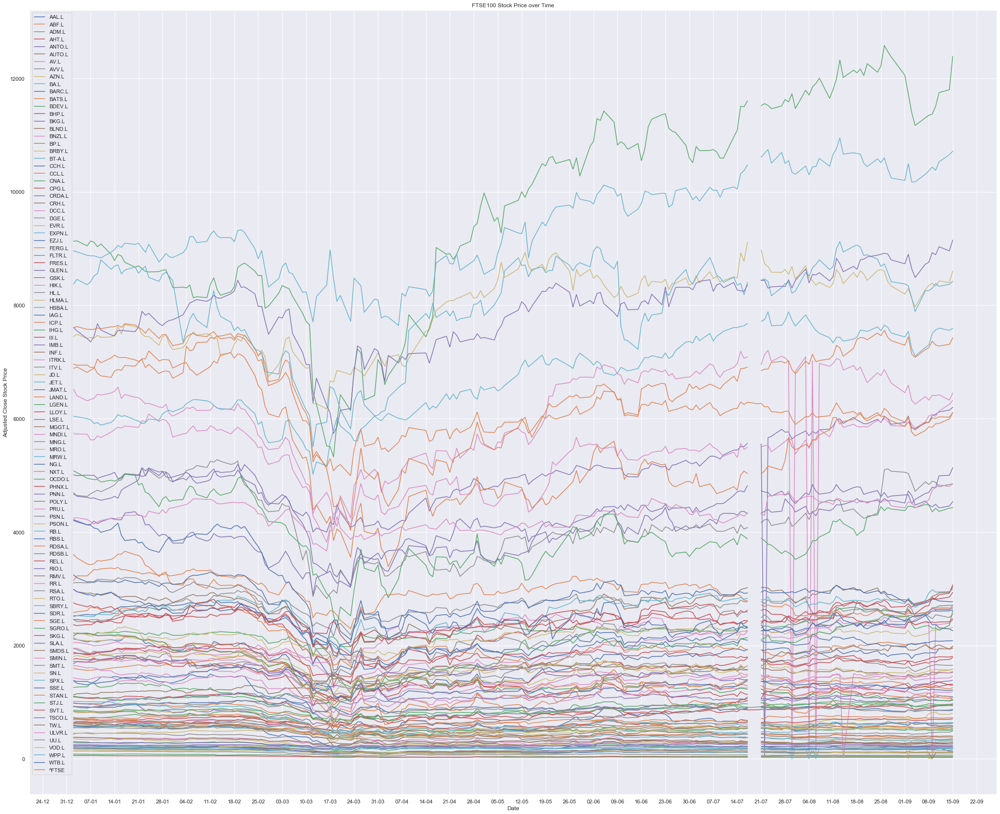

In [16]:
# Creating a plot to show all stocks across all dates on the same chart

import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter

sns.set()

fig, ax = plt.subplots(figsize=(36,30))

for x in adj_close.columns:
    ax.plot(adj_close.index.values,
           adj_close[x],
           label = str(x))
    
ax.set(xlabel = 'Date', ylabel = 'Adjusted Close Stock Price', title = 'FTSE100 Stock Price over Time')

date_form = DateFormatter('%d-%m')
ax.xaxis.set_major_formatter(date_form)

ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))

plt.legend(loc='upper left')
plt.show()

Great! This is useful to see the general trend of stocks. It is quite busy though, so we can also visualise each stock individually:

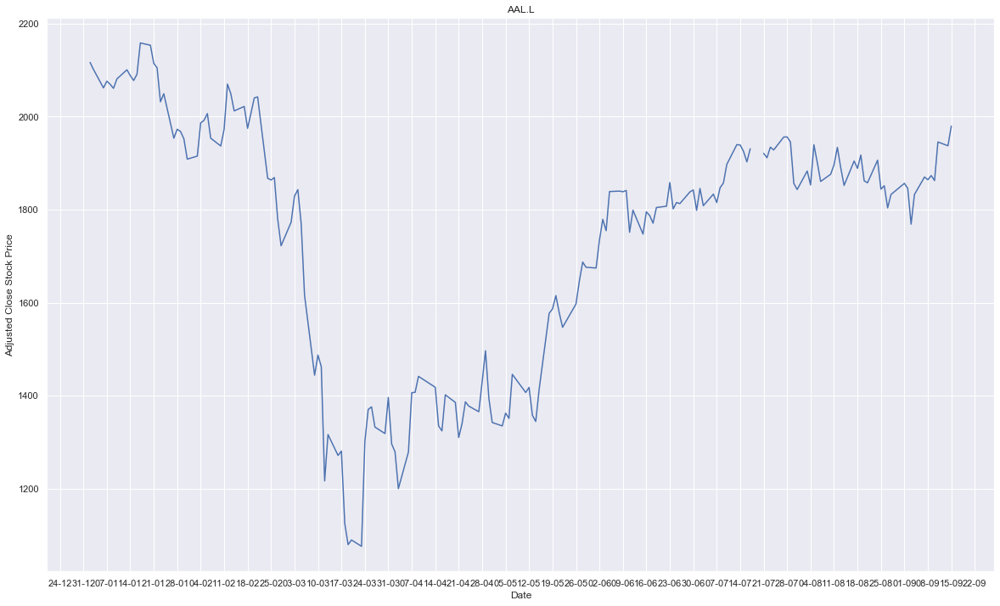

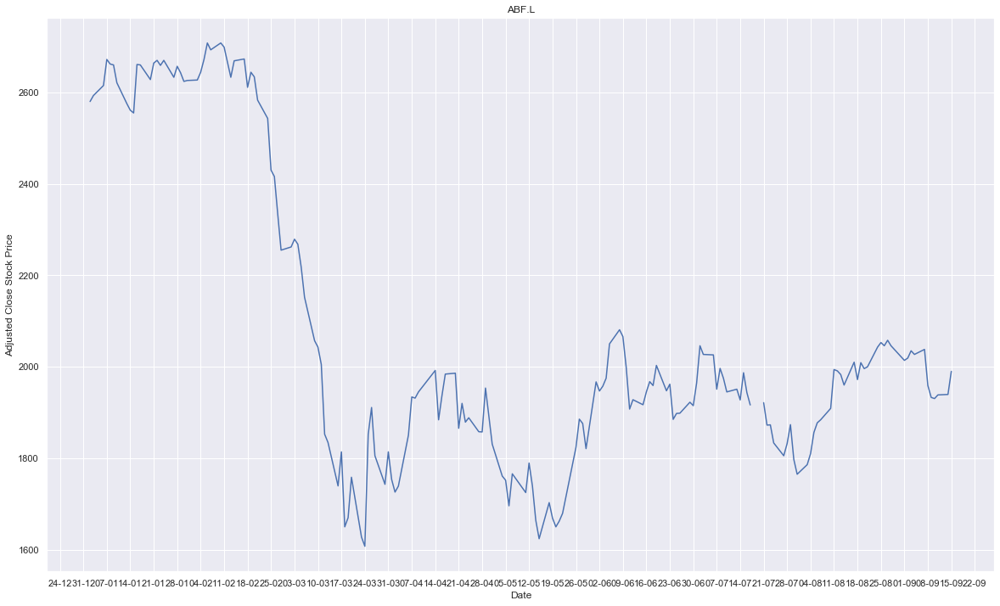

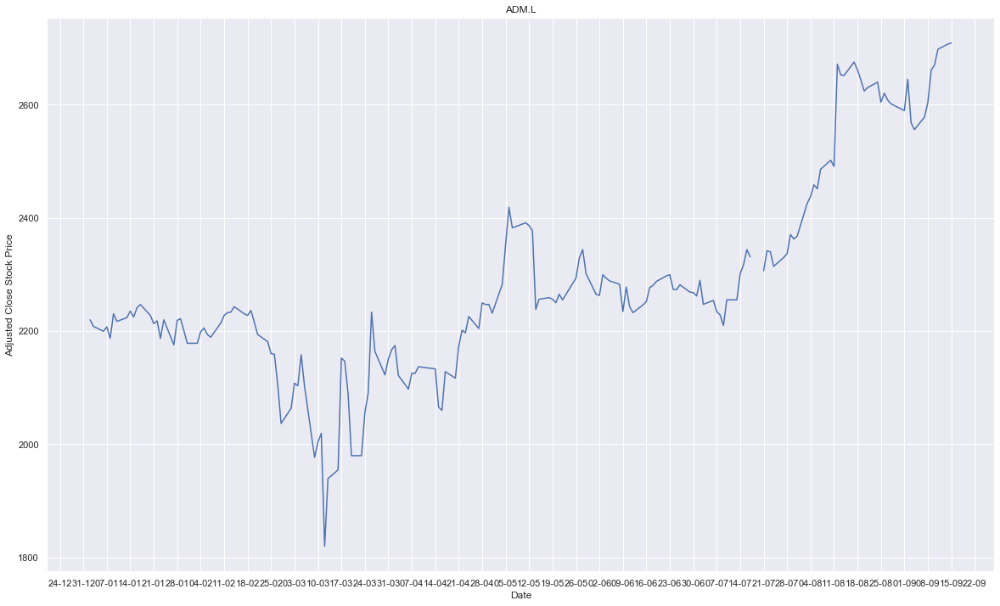

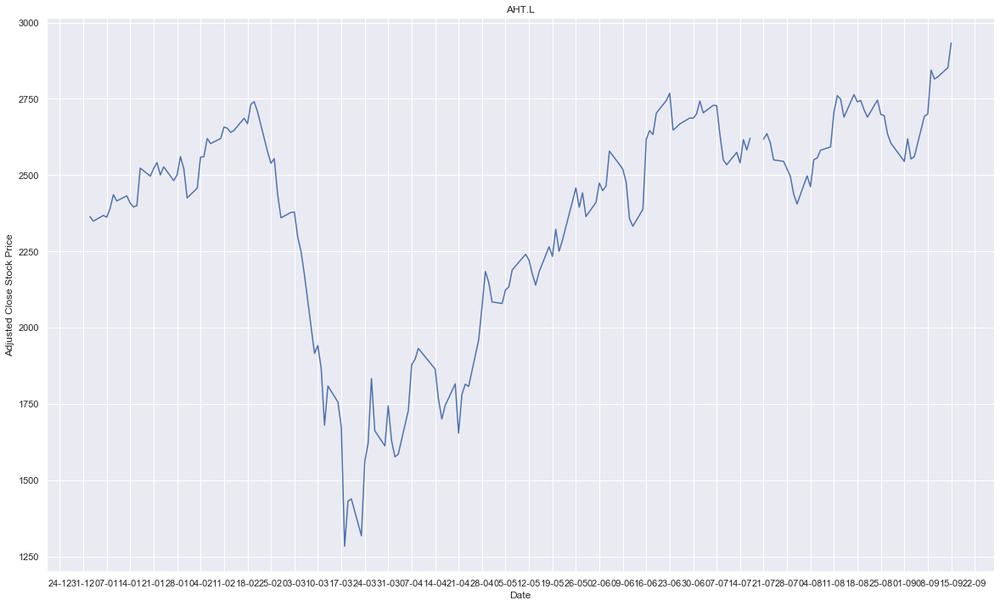

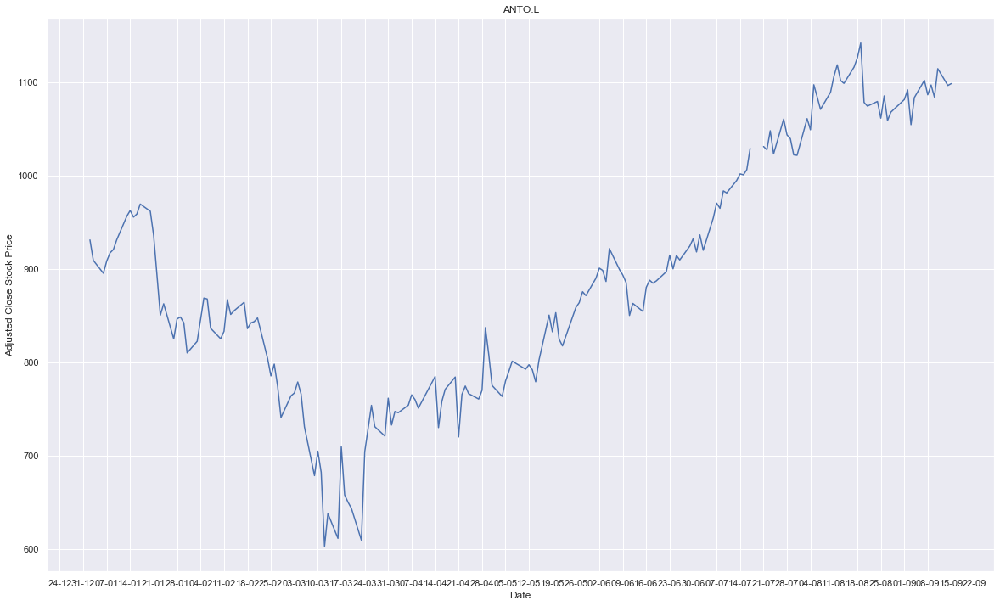

...

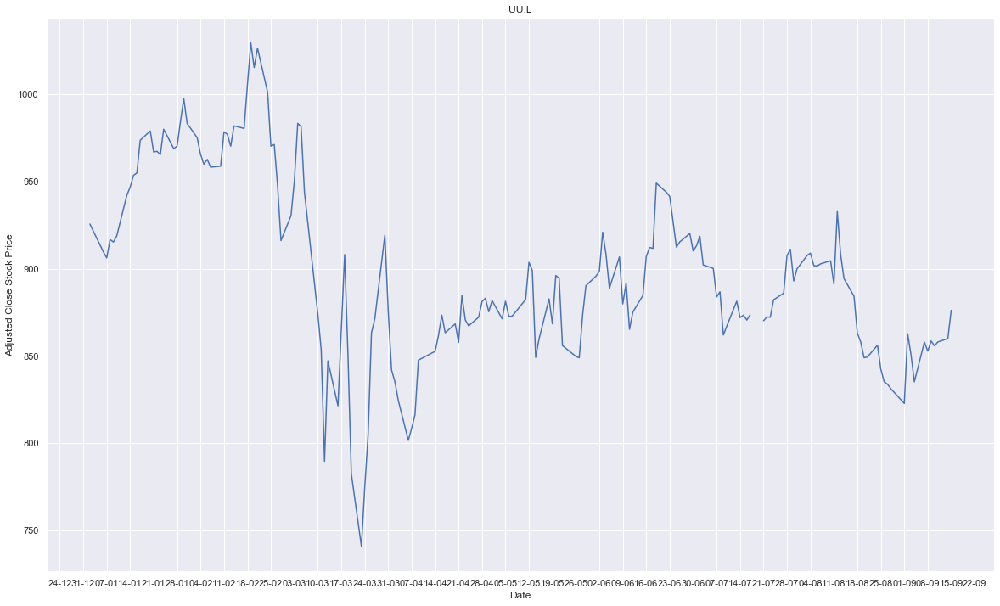

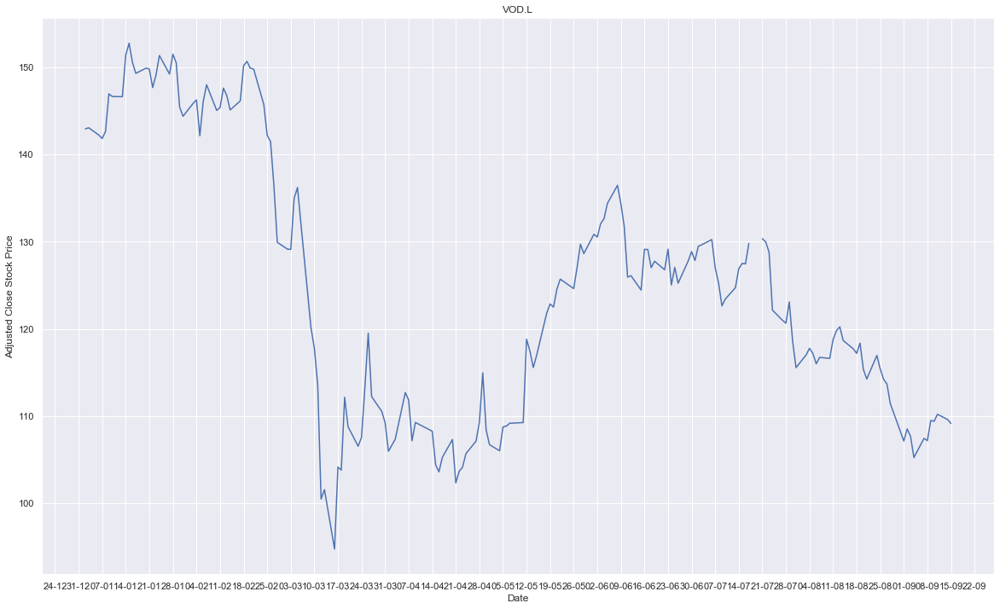

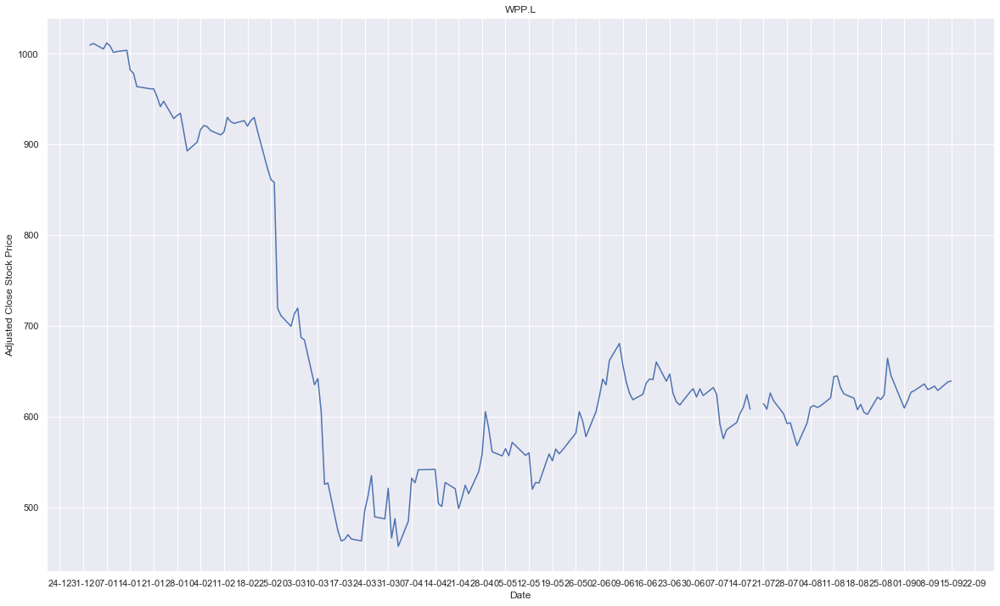

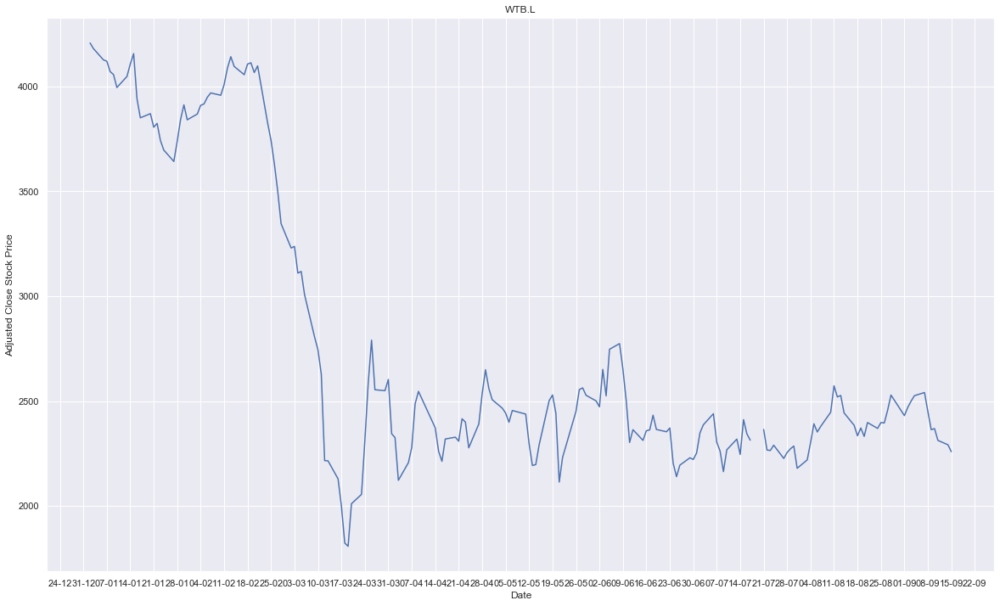

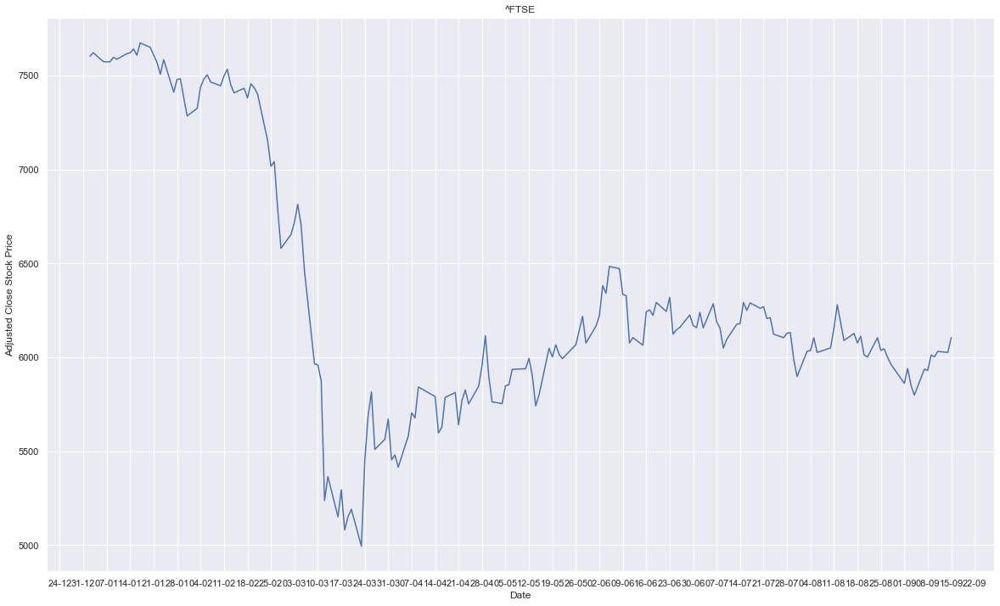

In [15]:
# Creating a loop to visualise each stock by itself:

for stock in adj_close.columns:
    sns.set()
    fig, ax = plt.subplots(figsize=(20,12))
    plt.plot(adj_close.index.values, adj_close[stock].values)
    ax.set(xlabel = 'Date', ylabel = 'Adjusted Close Stock Price', title = stock)
    date_form = DateFormatter('%d-%m')
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    plt.show()

## Visualizing FTSE100 Stocks by Industry:

Now that we've got our data and we have begun to explore it a little, we can augment it by bringing in additional information. Let's label each stock in the FTSE100 by Sector and Subsector, as given by the FTSE100 ICB Sector classifications available for each of the stocks on the London Stock Exchange website. Industry Classification Benchmark (ICB) is a globally utilized standard for the categorization and comparison of companies by industry and sector. It is the official sector classification used across FTSE Russell indices for analysis, attribution and performance measurement:

In [20]:
# Read in the data from stored CSV

sectors = pd.read_csv('FTSE100 Stocks Info Data.csv')

In [21]:
# Inspect the data

sectors

,Stock,Company Name,FTSE ICB sector,FTSE ICB subsector
0,III.L,3I GRP.,Investment Banking and Brokerage Services,Asset Managers and Custodians
1,ABF.L,A.B.FOOD,Food Producers,Food Products
2,ADM.L,ADMIRAL GRP,Non-life Insurance,Property and Casualty Insurance
3,AAL.L,ANGLO AMERICAN,Industrial Metals and Mining,General Mining
4,ANTO.L,ANTOFAGASTA,Industrial Metals and Mining,Copper
...,...,...,...,...
97,UU.L,UTD. UTILITIES,"Gas, Water and Multi-utilities",Water
98,VOD.L,VODAFONE GRP.,Telecommunications Service Providers,Telecommunications Services
99,WTB.L,WHITBREAD,Travel and Leisure,Restaurants and Bars
100,WPP.L,WPP,Media,Media Agencies


In [22]:
sectors['FTSE ICB sector'].nunique()

35

In [23]:
sectors['FTSE ICB subsector'].nunique()

57

In [24]:
# Arrange the data by FTSE ICB sector values

sectors.sort_values(by='FTSE ICB sector', inplace=True)

In [25]:
sectors

,Stock,Company Name,FTSE ICB sector,FTSE ICB subsector
56,MGGT.L,MEGGITT,Aerospace and Defense,Aerospace
76,RR.L,ROLLS-ROYCE HLG,Aerospace and Defense,Aerospace
10,BA.L,BAE SYS.,Aerospace and Defense,Defense
53,LLOY.L,LLOYDS GRP.,Banks,Banks
40,HSBA.L,HSBC HLDGS.UK,Banks,Banks
...,...,...,...,...
46,IAG.L,INTL CONSOL AIR,Travel and Leisure,Airlines
33,FLTR.L,FLUTTER ENT,Travel and Leisure,Casinos and Gambling
21,CCL.L,CARNIVAL,Travel and Leisure,Travel and Tourism
99,WTB.L,WHITBREAD,Travel and Leisure,Restaurants and Bars


In [26]:
# Create a list of all sectors and inspect what we have

sector_list = list(sectors['FTSE ICB sector'].unique())

In [27]:
sector_list

['Aerospace and Defense',
 'Banks',
 'Beverages',
 'Chemicals',
 'Closed End Investments',
 'Construction and Materials',
 'Consumer Services',
 'Electricity',
 'Electronic and Electrical Equipment',
 'FTSE100 Stock Index',
 'Food Producers',
 'Gas, Water and Multi-utilities',
 'General Industrials',
 'Household Goods and Home Construction',
 'Industrial Engineering',
 'Industrial Materials',
 'Industrial Metals and Mining',
 'Industrial Support Services',
 'Industrial Transportation',
 'Investment Banking and Brokerage Services',
 'Life Insurance',
 'Media',
 'Medical Equipment and Services',
 'Non-life Insurance',
 'Oil, Gas and Coal',
 'Personal Care, Drug and Grocery Stores',
 'Personal Goods',
 'Pharmaceuticals and Biotechnology',
 'Precious Metals and Mining',
 'Real Estate Investment Trusts',
 'Retailers',
 'Software and Computer Services',
 'Telecommunications Service Providers',
 'Tobacco',
 'Travel and Leisure']

Now that we have arranged our new data by sector, we can use this alongside our Ajusted Close stock data to group and visualise stocks by sector, which will allow us to look at the impact of the pandemic on each individual sector in the FTSE100 index:

In [30]:
# Create a dictionary with each sector as the key and the corresponding stocks as the values

thisdict = {}

for x in sector_list:
    x = x
    y = list(sectors[sectors['FTSE ICB sector'] == x]['Stock'])
    thisdict.update({x:y})

In [31]:
thisdict

{'Aerospace and Defense': ['MGGT.L', 'RR.L', 'BA.L'],
 'Banks': ['LLOY.L', 'HSBA.L', 'RBS.L', 'STAN.L', 'BARC.L'],
 'Beverages': ['DGE.L', 'CCH.L'],
 'Chemicals': ['CRDA.L', 'JMAT.L'],
 'Closed End Investments': ['SMT.L'],
 'Construction and Materials': ['CRH.L'],
 'Consumer Services': ['CPG.L'],
 'Electricity': ['SSE.L'],
 'Electronic and Electrical Equipment': ['HLMA.L'],
 'FTSE100 Stock Index': ['^FTSE'],
 'Food Producers': ['ABF.L'],
 'Gas, Water and Multi-utilities': ['SVT.L', 'CNA.L', 'UU.L', 'NG.L', 'PNN.L'],
 'General Industrials': ['SMDS.L', 'BNZL.L', 'SKG.L', 'SMIN.L', 'MRO.L'],
 'Household Goods and Home Construction': ['PSN.L', 'BKG.L', 'TW.L', 'BDEV.L'],
 'Industrial Engineering': ['SPX.L'],
 'Industrial Materials': ['MNDI.L'],
 'Industrial Metals and Mining': ['GLEN.L',
  'BHP.L',
  'AAL.L',
  'ANTO.L',
  'EVR.L',
  'RIO.L'],
 'Industrial Support Services': ['RTO.L',
  'EXPN.L',
  'DCC.L',
  'ITRK.L',
  'FERG.L'],
 'Industrial Transportation': ['AHT.L'],
 'Investment Bank

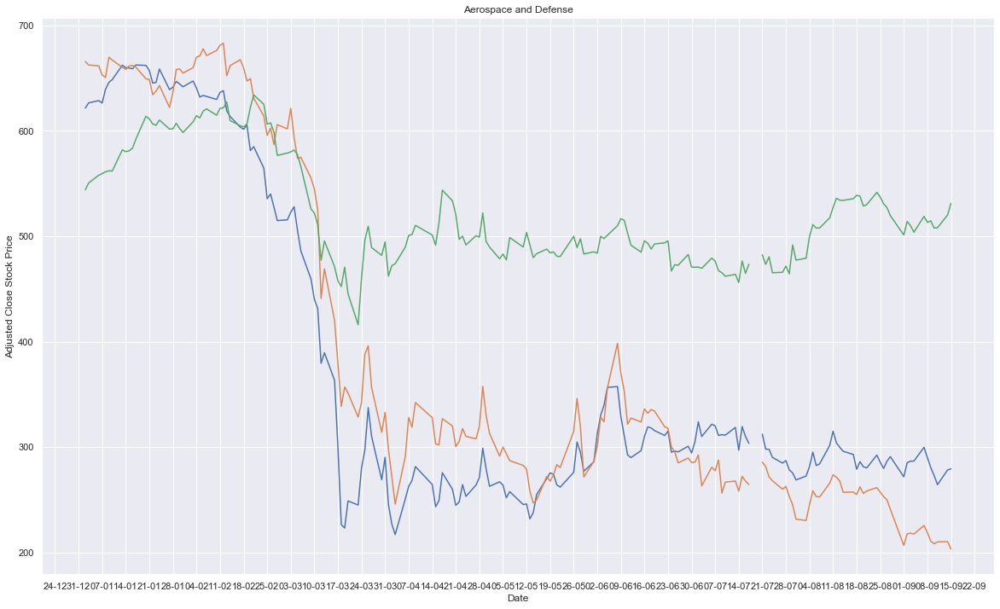

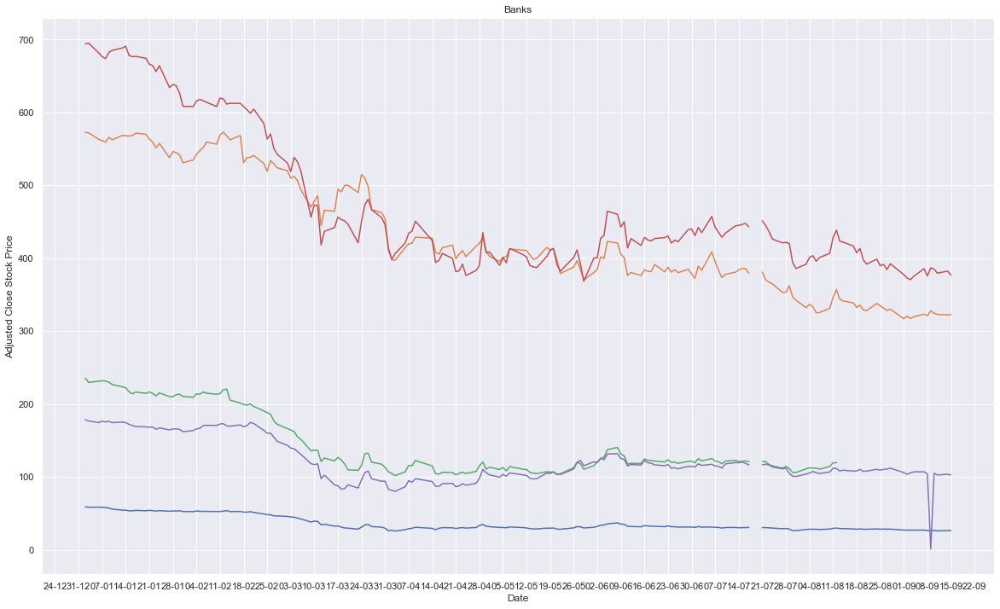

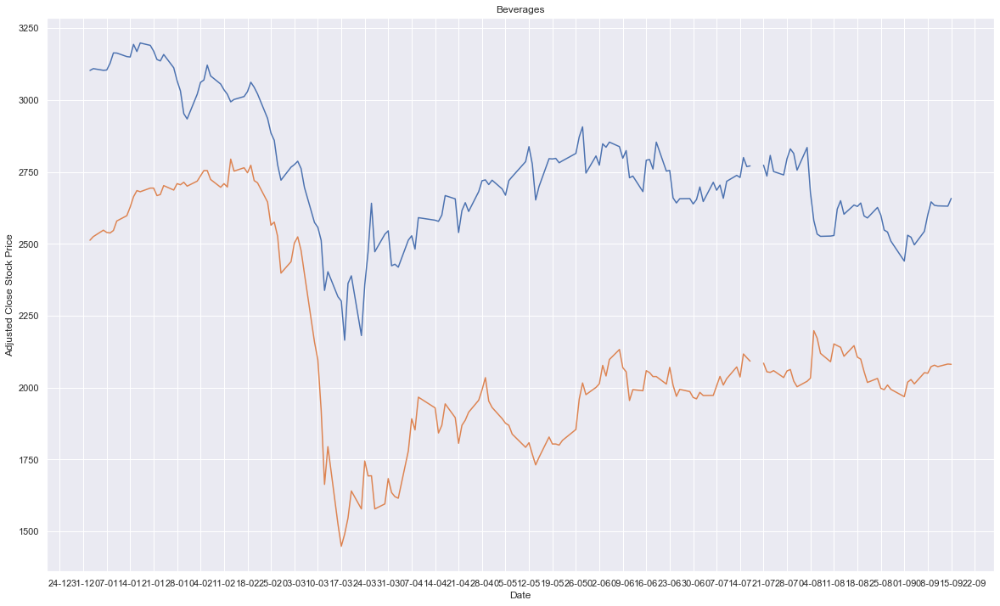

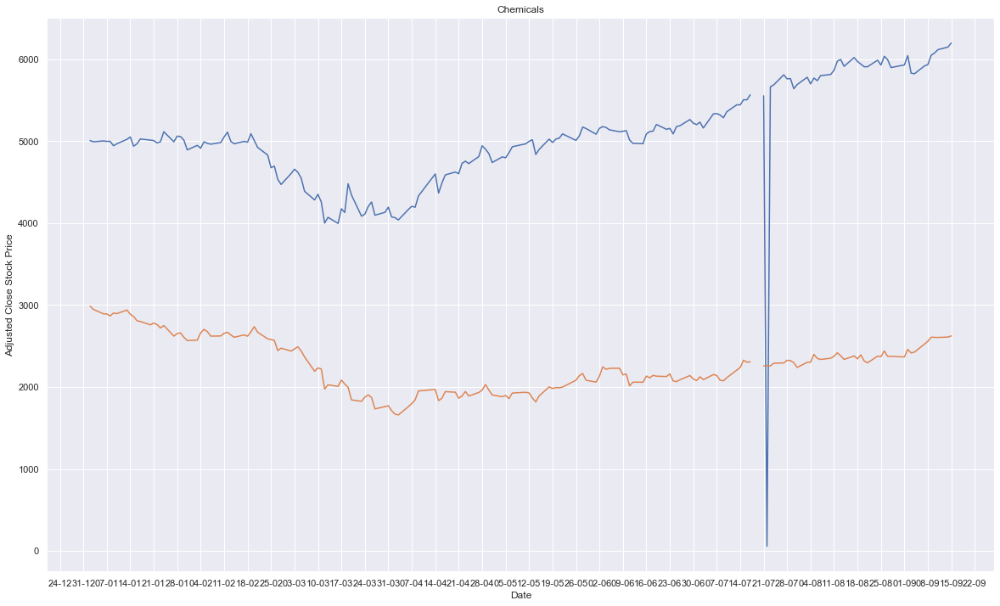

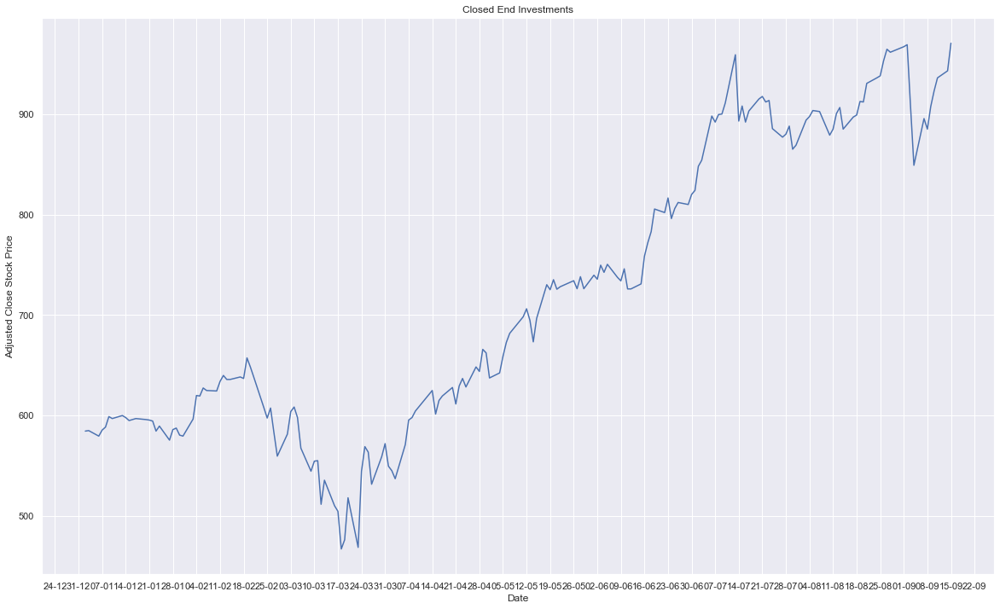

...

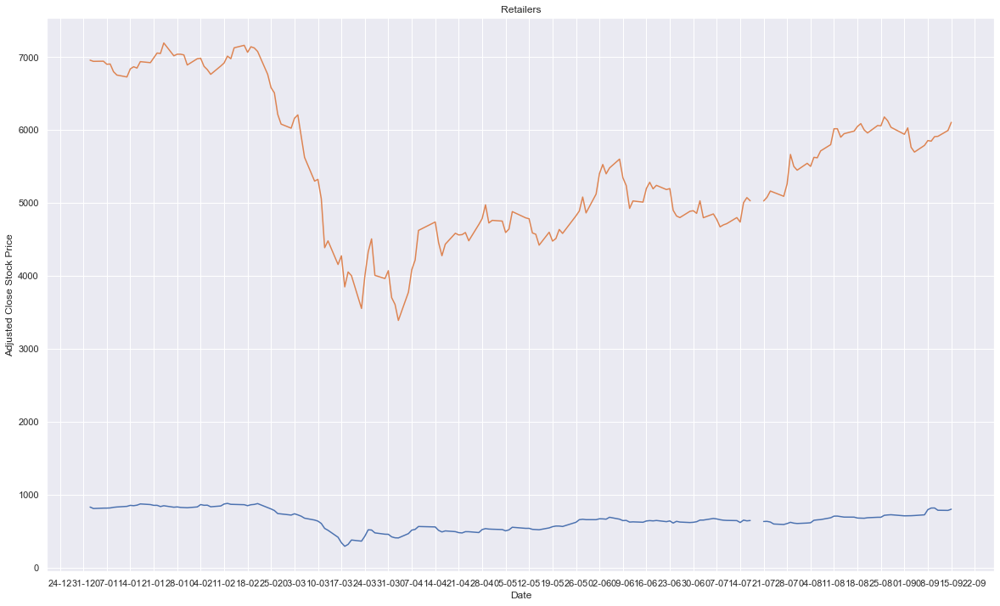

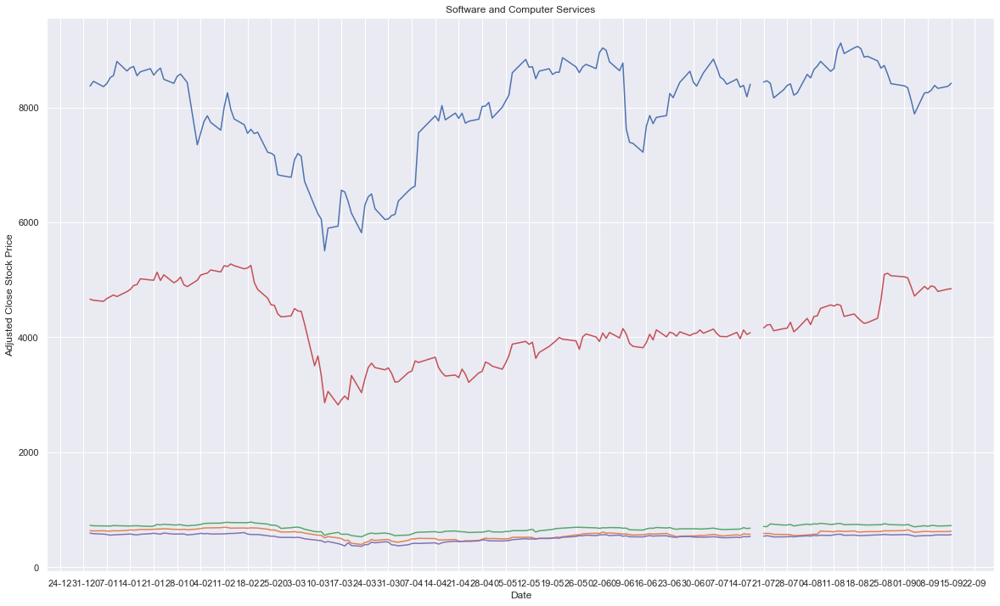

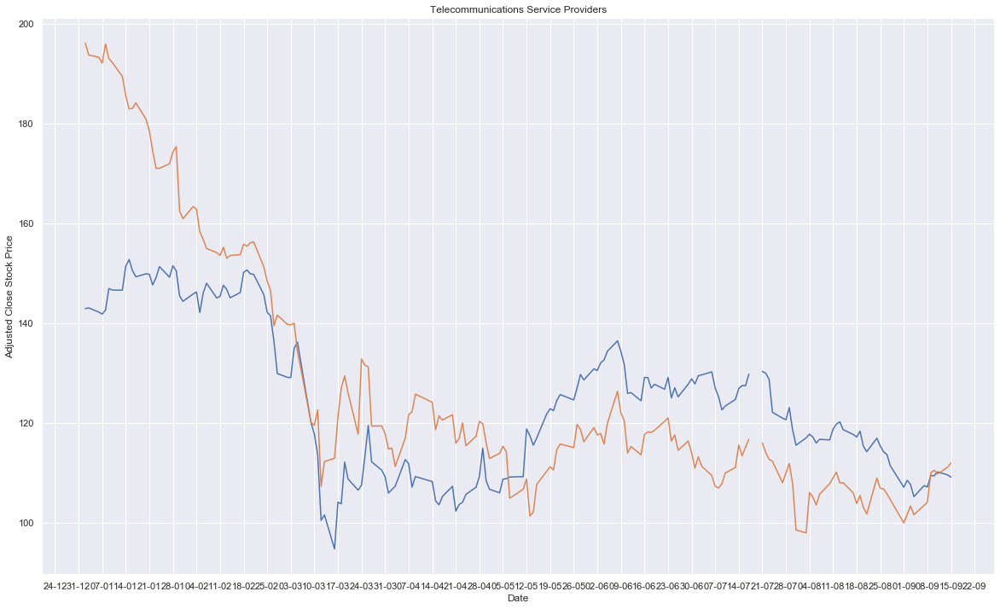

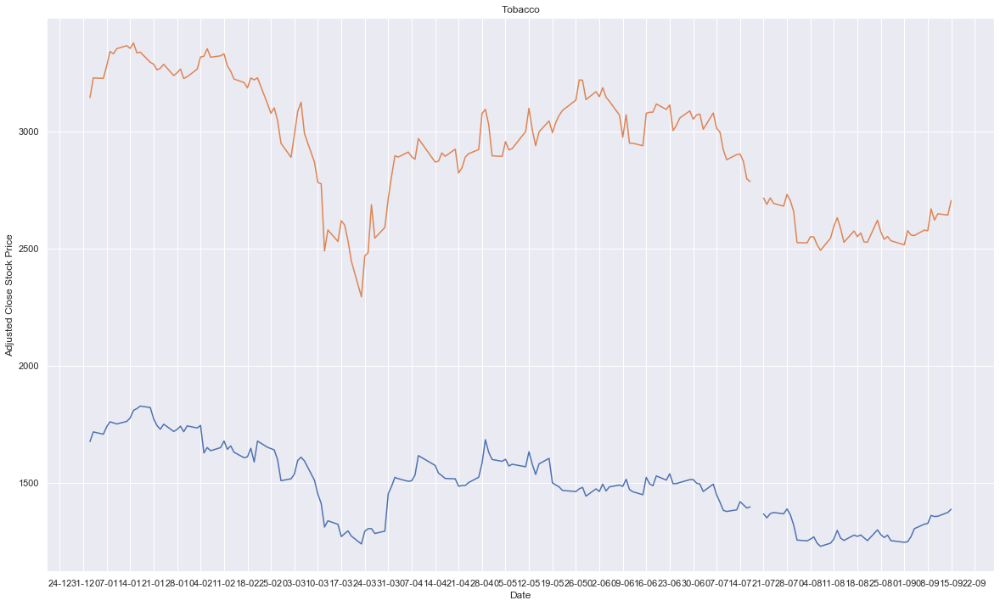

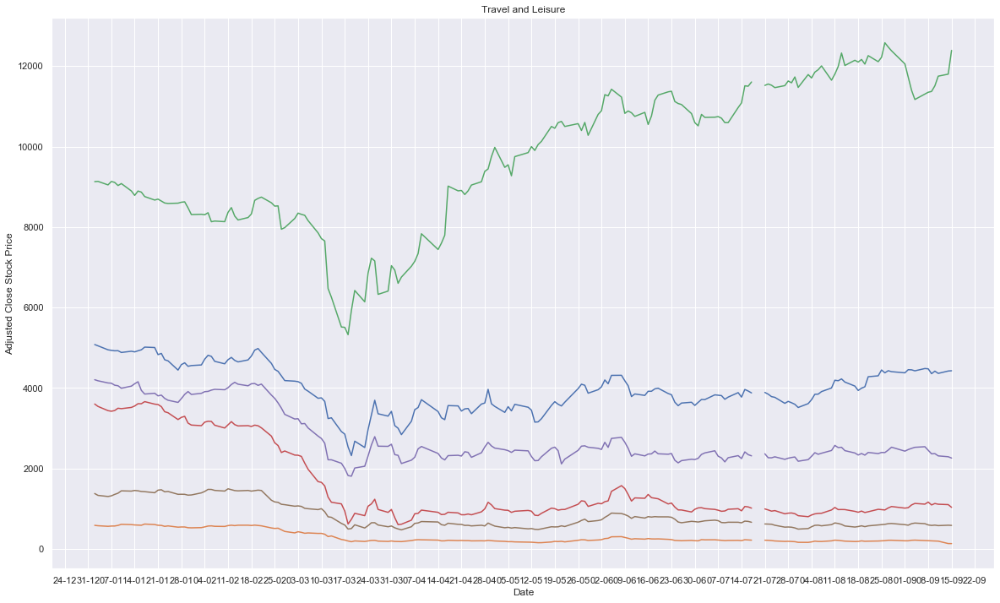

In [32]:
# Create a loop just as we did earlier to visualise our stock date by sector

for key, value in thisdict.items():
    sns.set()
    fig, ax = plt.subplots(figsize=(20,12))
    plt.plot(adj_close[value].index.values, adj_close[value].values)
    ax.set(xlabel = 'Date', ylabel = 'Adjusted Close Stock Price', title = key)
    date_form = DateFormatter('%d-%m')
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    plt.show()

Great!

So now we can begin to use this data alongside other data in the wider Covid-19 dataset to assess the impacts of the pandemic. Specifically for the FTSE100 data, we built an interactive dashboard in DC which visualises this data in a similar way to how we have done in this notebook, but with interactive functionality and in a much more user-friendly way. The dashboard is served by an API which connects to our database containing this data. You can access the API here:

https://iqapi.azurewebsites.net/api/ftse

And here is what the FTSE100 Dashboard which is served by this API looks like:

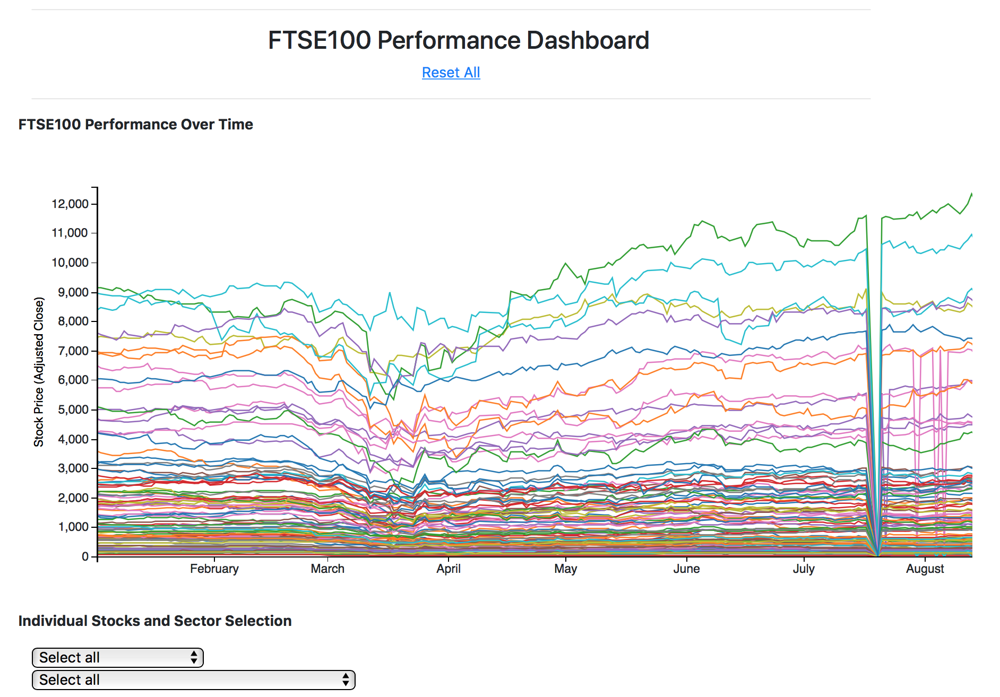